# VCF and image files available for the same patients


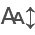

In [ ]:
try:
  from itables import(
     init_notebook_mode, show 
    ) 
except:
  !pip install -r https://raw.githubusercontent.com/CancerDataAggregator/Community-Notebooks/main/requirements.txt


import numpy as np
import pandas as pd
from itables import init_notebook_mode, show
init_notebook_mode(all_interactive=True)
import itables.options as opt

opt.classes="display nowrap compact"
opt.buttons=["copyHtml5", "csvHtml5", "excelHtml5"]
opt.maxBytes=0

from cdapython import *

I'm a cancer researcher, and I have a hypothesis that I can correlate a specific mutation with a specific kidney cancer morphology. I'm looking for subjects that have kidney cancer with both CT and sequencing data that I might be able to incorporate into my research.

First, decide what column to search. I'm looking for columns that have to do with file type:

In [7]:
columns(table="file")

table            column data_type  nullable  \
0   file           file_id      text     False   
1   file            access      text      True   
2   file     anatomic_site      text      True   
3   file          category      text      True   
4   file           drs_uri      text      True   
5   file  file_description      text      True   
6   file         file_name      text      True   
7   file         file_type      text      True   
8   file            format      text      True   
9   file              size    bigint      True   
10  file   tumor_vs_normal      text      True   

                                          description  
0   A unique identifier for this file minted by CD...  
1                  Denotes controlled vs open access.  
2   One or more anatomic sites described by this f...  
3   General category of file data. In the case of ...  
4   A resolvable DRS URI minted for this file and ...  
5                 Optional text describing this file.  
6   File name or label (may optionally include loc...  
7   File data type (like "CT image" or "miRNA expr...  
8                File format (like JPEG, PDF or CSV).  
9   File size in bytes. In the case of a DICOM ser...  
10  One or more tumor/normal characterizations of ...

In [8]:
column_values("file_type")

file_type  value_count
0                                           <NA>       371004
1                         Somatic Mutation Index       303527
2                            Enhanced SR Storage       261681
3                               CT Image Storage       246602
4                     Annotated Somatic Mutation       214766
..                                           ...          ...
70              X-Ray Angiographic Image Storage           23
71              Real World Value Mapping Storage           20
72  Digital X-Ray Image Storage - For Processing           11
73               X-Ray Radiation Dose SR Storage            1
74         X-Ray Radiofluoroscopic Image Storage            1

[75 rows x 2 columns]

CT image storage and annotated somatic mutation files should give me the data I want. Now to find a column to seperate out the kidney cancer subjects:

In [9]:
columns()

table                   column data_type  nullable  \
0                   file                  file_id      text     False   
1                   file                   access      text      True   
2                   file            anatomic_site      text      True   
3                   file                 category      text      True   
4                   file                  drs_uri      text      True   
..                   ...                      ...       ...       ...   
59             treatment  treatment_anatomic_site      text      True   
60             treatment           treatment_type      text      True   
61  upstream_identifiers              upstream_id      text     False   
62  upstream_identifiers           upstream_field      text     False   
63  upstream_identifiers          upstream_source      text     False   

                                          description  
0   A unique identifier for this file minted by CD...  
1                  Denotes controlled vs open access.  
2   One or more anatomic sites described by this f...  
3   General category of file data. In the case of ...  
4   A resolvable DRS URI minted for this file and ...  
..                                                ...  
59  Anatomic site targeted by this treatment, clas...  
60                       Type of treatment performed.  
61  One identifier, exactly as published by the sp...  
62  What this identifier is called by the specifie...  
63  The upstream data source from which this ident...  

[64 rows x 5 columns]

In [10]:
column_values("anatomic_site", filters= "*kidney*" )

anatomic_site  value_count
0            kidney        46276
1  cortex of kidney          549
2      right kidney          224
3       left kidney          148

Looks like there are lots of kidney patients, however kidney has been specified a few different ways, so I'll have to search with a wildcard. This makes my three search parameters:

- `'anatomic_site = *kidney'` (the `*` means match anything that ends with kidney no matter what words or letters are after it.)

- `'file_type = CT Image Storage'`

- `'file_type = Annotated Somatic Mutation'`

But if I run a search with `file_type` in it twice, it will only give me back files that are both a `CT Image Storage` AND an `Annotated Somatic Mutation`. No one file can be both of those things, so what I will really want is to do two searches, one for kidney and CT:

```
get_subject_data(match_all=['anatomic_site = *kidney', 'file_type = CT Image Storage'])
```

and one for kidney and mutation:

```
get_subject_data(match_all=['anatomic_site = *kidney', 'file_type = Annotated Somatic Mutation'])
```

and then combine the results.

I want subject data, so I'll search by subject, and I'll add the file data on so I know where to get the files. Again `*` means "anything" so doing `add_columns = "file.*"` will add all the file columns.

So all together we have

Get the results for each search and save them in variables:

In [ ]:
CT = get_subject_data(match_all=['anatomic_site = *kidney', 'file_type = CT Image Storage'], add_columns="file.*")
mutation = get_subject_data(match_all=['anatomic_site = *kidney', 'file_type = Annotated Somatic Mutation'], add_columns="file.*")


get the intersection of the results:

In [ ]:

CTmutation = intersect_subject_results(CT, mutation)
CTmutation

subject_id         cause_of_death     ethnicity   race species  \
0   CPTAC.C3L-00608                   <NA>  Non-Hispanic  White   human   
1   CPTAC.C3L-00610                   <NA>  Non-Hispanic  White   human   
2   CPTAC.C3L-00766                   <NA>  Non-Hispanic  White   human   
3   CPTAC.C3L-00792                   <NA>          <NA>  White   human   
4   CPTAC.C3L-00799                   <NA>  Non-Hispanic  White   human   
..              ...                    ...           ...    ...     ...   
57  CPTAC.C3N-02723  Surgical Complication          <NA>   <NA>   human   
58  CPTAC.C3N-02811                   <NA>  Non-Hispanic  White   human   
59  CPTAC.C3N-02818                   <NA>  Non-Hispanic  White   human   
60  CPTAC.C3N-03018                   <NA>          <NA>  White   human   
61  CPTAC.C3N-03019                   <NA>          <NA>  White   human   

    year_of_birth year_of_death           data_source  \
0            1955          <NA>       [GDC, IDC, PDC]   
1            1959          <NA>  [CDS, GDC, IDC, PDC]   
2            1959          <NA>  [CDS, GDC, IDC, PDC]   
3            1926          <NA>  [CDS, GDC, IDC, PDC]   
4            1975          <NA>  [CDS, GDC, IDC, PDC]   
..            ...           ...                   ...   
57           1931          2017       [GDC, IDC, PDC]   
58           1942          <NA>       [GDC, IDC, PDC]   
59           1948          2021       [GDC, IDC, PDC]   
60           1952          <NA>       [GDC, IDC, PDC]   
61           1971          <NA>       [GDC, IDC, PDC]   

                                         file_type             anatomic_site  \
0   [Annotated Somatic Mutation, CT Image Storage]           [blood, kidney]   
1   [Annotated Somatic Mutation, CT Image Storage]           [blood, kidney]   
2   [Annotated Somatic Mutation, CT Image Storage]           [blood, kidney]   
3   [Annotated Somatic Mutation, CT Image Storage]           [blood, kidney]   
4   [Annotated Somatic Mutation, CT Image Storage]           [blood, kidney]   
..                                             ...                       ...   
57  [Annotated Somatic Mutation, CT Image Storage]           [blood, kidney]   
58  [Annotated Somatic Mutation, CT Image Storage]  [abdomen, blood, kidney]   
59  [Annotated Somatic Mutation, CT Image Storage]    [blood, chest, kidney]   
60  [Annotated Somatic Mutation, CT Image Storage]           [blood, kidney]   
61  [Annotated Somatic Mutation, CT Image Storage]  [abdomen, blood, kidney]   

                                              file_id  \
0   [071a2d48-c53d-47ba-b00b-8d9303e47985, 0f44b7e...   
1   [02e2e5b8-7274-4719-a956-f78015f41d53, 0d65fc0...   
2   [449f3e1d-8744-4853-9124-9d5b20413f7f, 453dc66...   
3   [0cef223d-b4d8-4d7e-b008-ca515efcaaad, 14d1027...   
4   [1273427e-2d4e-4515-ad48-c097a0de5c5f, 130b1b3...   
..                                                ...   
57  [1e49086a-6e93-4407-955e-0f811efc921b, 2340886...   
58  [177aa6b3-480d-4711-9376-754ad25842b2, 327b120...   
59  [00e47088-84d5-41f8-8c7b-ed6059780c6c, 1761b3d...   
60  [037e340d-2227-44f0-be69-9875206dc3bb, 2be3ed3...   
61  [0d288d4f-0670-44a9-9502-83a4f157c0e8, 4ca198e...   

                                            file_name  \
0   [08f577dc-1e8b-43fb-b666-47a1158829fb.wxs.Pind...   
1   [1c750c16-27cb-4f53-94d2-04176abaab17.wxs.VarS...   
2   [00911315-2d37-4099-a311-0c0218040630.wxs.VarS...   
3   [08569580-03af-469f-820b-9ba08bcb90a5.wxs.VarS...   
4   [5ab25d06-e269-47fd-9240-e8a04096dcac.wxs.VarS...   
..                                                ...   
57  [21e30713-76d5-4023-9e49-99a386db11b3.wxs.MuTe...   
58  [2d75a1b3-d782-4d19-a791-39218c48633d.wxs.MuTe...   
59  [3ba70bbb-7af4-41dd-93a5-e87714636710.wxs.VarS...   
60  [0f933410-fbc4-4975-a24c-e90619a3a42f.wxs.VarS...   
61  [6109f6b5-397e-447c-9b41-222a52f8bfd2.wxs.VarS...   

                                     file_description  \
0   [COR 2X2, DIAPHRAM TO CREST 3 M

looking at the `file_type` column and `file_id` column, I can't actually tell which file has which type. To make it easier see which bits of data go together I'm going to re-run my search, but add `collate_results= True`. That will take all of the columns with multiple values and pair them up, so I can tell which files have which file types:

In [15]:
CT = get_subject_data(match_all=['anatomic_site = *kidney', 'file_type = CT Image Storage'], add_columns="file.*", collate_results= True)
mutation = get_subject_data(match_all=['anatomic_site = *kidney', 'file_type = Annotated Somatic Mutation'], add_columns="file.*", collate_results= True)
CTmutation = intersect_subject_results(CT, mutation)
CTmutation

subject_id         cause_of_death     ethnicity   race species  \
0   CPTAC.C3L-00608                   <NA>  Non-Hispanic  White   human   
1   CPTAC.C3L-00610                   <NA>  Non-Hispanic  White   human   
2   CPTAC.C3L-00766                   <NA>  Non-Hispanic  White   human   
3   CPTAC.C3L-00792                   <NA>          <NA>  White   human   
4   CPTAC.C3L-00799                   <NA>  Non-Hispanic  White   human   
..              ...                    ...           ...    ...     ...   
57  CPTAC.C3N-02723  Surgical Complication          <NA>   <NA>   human   
58  CPTAC.C3N-02811                   <NA>  Non-Hispanic  White   human   
59  CPTAC.C3N-02818                   <NA>  Non-Hispanic  White   human   
60  CPTAC.C3N-03018                   <NA>          <NA>  White   human   
61  CPTAC.C3N-03019                   <NA>          <NA>  White   human   

    year_of_birth year_of_death           data_source  \
0            1955          <NA>       [GDC, IDC, PDC]   
1            1959          <NA>  [CDS, GDC, IDC, PDC]   
2            1959          <NA>  [CDS, GDC, IDC, PDC]   
3            1926          <NA>  [CDS, GDC, IDC, PDC]   
4            1975          <NA>  [CDS, GDC, IDC, PDC]   
..            ...           ...                   ...   
57           1931          2017       [GDC, IDC, PDC]   
58           1942          <NA>       [GDC, IDC, PDC]   
59           1948          2021       [GDC, IDC, PDC]   
60           1952          <NA>       [GDC, IDC, PDC]   
61           1971          <NA>       [GDC, IDC, PDC]   

                                            file_data  
0      data_source                               f...  
1      data_source                               f...  
2      data_source                               f...  
3      data_source                               f...  
4      data_source                               f...  
..                                                ...  
57     data_source                               f...  
58     data_source                               f...  
59     data_source                               f...  
60     data_source                               f...  
61     data_source                               f...  

[62 rows x 9 columns]

Now I have a new column called `file_data`, where each row has the `data_source`, `file_id`, and `access` collated by file. This is great if i'm putting it into another command, but its kind of hard to read as a human, so I'm going to `expand_subject_results`, which will take all the info in this subject search, and expand it out into a new dataframe:

In [17]:
expand_subject_results(CTmutation, 'file_data')

subject_id data_source                               file_id  \
0     CPTAC.C3L-00608         IDC  8898980a-fe3c-45e1-8d39-666f4d7bf93a   
1     CPTAC.C3L-00608         IDC  1c1fffdf-5f0b-4bc3-961d-0ba811ee956a   
2     CPTAC.C3L-00608         IDC  0f44b7ec-9a9b-420b-b41a-d51ef6c8c600   
3     CPTAC.C3L-00608         IDC  4217bb8a-0f2f-42ea-8e40-45f1391c201b   
4     CPTAC.C3L-00608         IDC  7bce7ab3-bc03-48cc-a986-bd1e8d85a885   
...               ...         ...                                   ...   
1366  CPTAC.C3N-03019         GDC  d4397517-3cb6-4260-b1e9-057e90850c4a   
1367  CPTAC.C3N-03019         GDC  91888001-d0ee-4bb9-a73c-4a220ede6848   
1368  CPTAC.C3N-03019         GDC  aecb31cc-6e90-4422-9f48-7811f8c33d47   
1369  CPTAC.C3N-03019         GDC  56fa8013-437b-44e1-96a7-6f7e78eee610   
1370  CPTAC.C3N-03019         GDC  b0420600-12c2-4215-868c-c5ff2a1dd90d   

          access    anatomic_site                     category  \
0           open         [kidney]          Computed Tomography   
1           open         [kidney]          Computed Tomography   
2           open         [kidney]          Computed Tomography   
3           open         [kidney]          Computed Tomography   
4           open         [kidney]          Computed Tomography   
...          ...              ...                          ...   
1366  controlled  [blood, kidney]  Simple Nucleotide Variation   
1367  controlled  [blood, kidney]  Simple Nucleotide Variation   
1368  controlled  [blood, kidney]  Simple Nucleotide Variation   
1369  controlled  [blood, kidney]  Simple Nucleotide Variation   
1370  controlled  [blood, kidney]  Simple Nucleotide Variation   

                                                drs_uri file_description  \
0     drs://dg.4dfc:a70c4b06-a592-4751-a624-d16d18fd...            SCOUT   
1     drs://dg.4dfc:028a6f55-d560-486a-b4cc-036d5af6...          COR 2X2   
2     drs://dg.4dfc:00083b57-c446-4834-aac3-43915756...          COR 2X2   
3     drs://dg.4dfc:046b5cfe-afa3-4d03-b835-9d3311f5...          COR 2X2   
4     drs://dg.4dfc:0263cd4f-7bfb-4f64-803f-ef9a7473...          SAG 2X2   
...                                                 ...              ...   
1366  drs://dg.4dfc:d4397517-3cb6-4260-b1e9-057e9085...             <NA>   
1367  drs://dg.4dfc:91888001-d0ee-4bb9-a73c-4a220ede...             <NA>   
1368  drs://dg.4dfc:aecb31cc-6e90-4422-9f48-7811f8c3...             <NA>   
1369  drs://dg.4dfc:56fa8013-437b-44e1-96a7-6f7e78ee...             <NA>   
1370  drs://dg.4dfc:b0420600-12c2-4215-868c-c5ff2a1d...             <NA>   

                                              file_name  \
0                                                  <NA>   
1                                                  <NA>   
2                                                  <NA>   
3                                                  <NA>   
4                                                  <NA>   
...                                                 ...   
1366  CPTAC_3.ca3a3e24-45d1-4f52-b0e8-6f6f3f73e5a9.w...   
1367  CPTAC_3.95e170e9-e4a3-4478-9ef5-3694aec23da1.w...   
1368  6109f6b5-397e-447c-9b41-222a52f8bfd2.wxs.VarSc...   
1369  CPTAC_3.1cb45401-be68-419f-88d7-fe4ce9b46882.w...   
1370  CPTAC_3.735f48ec-071a-42a7-9964-f5d3a06890b5.w...   

                       file_type format       size  tumor_vs_normal  
0               CT Image Storage  DICOM    3115404               []  
1               CT Image Storage  DICOM   73854042               []  
2               CT Image Storage  DICOM   74376068               []  
3               CT Image Storage  DICOM   73854040               []  
4               CT Image Storage  DICOM  103395212               []  
...                          ...    ...        ...              ...  
1366  Annotated Somatic Mutation    VCF      54538  [normal, tumor]  
1367  Annotated Somatic Mutation    VCF     205065  [normal, tumor]  
1368  Annotated Somatic Mutation    MAF     162738  [normal, tumo

Note that my search originally had 62 subjects, one per row, with all their information for each column squished into that row. In the expanded version, I still have 62 subjects, but now subjects can have lots of rows, and each column only has the values that go together. Scroll through the table, and see that for the Computed Tomography results, there are still lots of drs_uris in a single row. Thats because CT scans themselves are usually composed of lots of layered images, so a given row is showing you the image set that makes up the CT, and the other variables that go with it. You'll have to scroll way to the right, but you can also see that CTs don't usually have tumor_normal values.

If you go to the second page of results, there are some Annotated Somatic Mutation files. These only have one drs_uri each, because mutation files are usually not split up, and if you scroll way to the right, you'll see that they do have tumor_vs_normal values. Thats because the files themselves are information about mutations, and to know if a basepair is a mutation, you need to compare it to something. In all of these MAFs and VCFs, the mutation is one found in one persons tumor when compared to their normal tissue, so all of these are built with both normal and tumor data.
